# Notebook to look at different settings of multi-step predictions
- Multi-step predictions (single shot) without "forecasted" meteorological data
- Single-step predictions with "forecasted" meteorological data
- Test univariate (only discharge) single step prediction with "forecasted" discharge
- Multi-step predictions (single shot) with "forecasted" meteorological data

In [ ]:
# import necessary libraries
import timeit
import time
import random
import importlib.util
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import preprocessing, metrics
import plotly.express as px
import plotly.graph_objs as go
import functools
import operator

In [ ]:
# import general Utiltiy Functions Module as gUF
spec = importlib.util.spec_from_file_location("generalUtilityFunctions.py","C:/Users/leonf/Documents/Python/Masterthesis-Leon/Utility_Functions/generalUtilityFunctions.py")
gUF = importlib.util.module_from_spec(spec)
spec.loader.exec_module(gUF)

In [ ]:
#os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # if the model should run on CPU
gpus = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], enable=True)
#tf.config.experimental.set_virtual_device_configuration(gpus[0],[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4048)])

#### Load the Data

In [ ]:
# Load the specific Dataset
option_data = 12

if option_data == 1: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Created_tables/DATA_daily.pkl")
    info_data =  "Not Imputed Dataset"
if option_data == 2: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_daily_AVwC.pkl")
    info_data = "AVwC Dataset"
if option_data == 3: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_daily_NRM_d.pkl")
    info_data = "NRM_d Dataset"
if option_data == 4: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_daily_IDW.pkl")
    info_data = "IDW Dataset"
if option_data == 5: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_daily_LR.pkl")
    info_data = "LR Dataset"
if option_data == 6: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Created_tables/DATA_daily_inside.pkl")
    info_data = "NRM_d Dataset only Stations inside Catchment"
if option_data == 7: # switch to hourly values from here on 
    DATA = pd.read_pickle('C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Created_tables/DATA.pkl')
    info_data = "Hourly Data - Not Imputed"
if option_data == 8: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_hourly_AVwC.pkl")
    info_data = "Hourly Data - AVwC"
if option_data == 9: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_hourly_NRM_d.pkl")
    info_data = "Hourly Data - NRM_d"
if option_data == 10: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_hourly_IDW.pkl")
    info_data = "Hourly Data - IDW"
if option_data == 11: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Imputed_tables/DATA_hourly_LR.pkl")
    info_data = "Hourly Data - LR"
if option_data == 12: 
    DATA = pd.read_pickle("C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Created_tables/DATA_hourly_inside.pkl")
    info_data = "Hourly Data - LR only Stations inside Catchment"

In [ ]:
# Load Larsim Data
data_basis = "hourly"
Larsim_simulations_daily = pd.read_pickle('C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Created_tables/Larsim_simulations_daily.pkl')
Larsim_simulations_hourly = pd.read_pickle('C:/Users/leonf/Documents/Python/Masterthesis-Leon/DATA/Created_tables/Larsim_simulations.pkl')

if data_basis == "daily":
    Larsim_simulations = Larsim_simulations_daily
if data_basis == "hourly":
    Larsim_simulations = Larsim_simulations_hourly

#### Prepare Input Dataset for the Model


In [ ]:
# choose if target station is included as input feature
with_target = True

# choose, if all usable discharge gauges should be used as additional input
with_discharge = False

if with_discharge == False:
    # Drop Discharge Stations and rearange the dataframe (last column: target values --> discharge at Marienthal(MARI)
    timestamps = DATA.index.values
    target_feature = ("q", "MARI")
    target_values = DATA.T[DATA.columns.isin([target_feature])].T
    # Model_data => Final Dataframe, that contains only the Data that should be fed into the NN
    model_data = DATA.drop(columns="q", level="Parameter")
    model_data = pd.concat([model_data, target_values], axis="columns", join="outer", levels="Parameter")
    # impute missing values in target/ discharge --> linear interpolation
    model_data["q", "MARI"].interpolate(method="time", axis=0, limit=None, inplace=True, limit_direction="both")
    df = model_data.copy()

if with_discharge == True and option_data < 7: # Daily Data
    # Drop Discharge Stations and rearange the dataframe (last column: target values --> discharge at Marienthal(MARI))
    timestamps = DATA.index.values
    target_feature = ('q','MARI')
    target_values = DATA.T[DATA.columns.isin([target_feature])].T
    # Model_data => Final Dataframe, that contains only the Data that should be fed into the NN
    ## Why drop columns='MARI' ??
    model_data = DATA.drop(columns='MARI', level='Stationskennung')
    ## Why increase nr columbs bq 1 ??
    model_data.columns.set_levels(['n', 'q_in', 'rflu', 'tlu_min', 'tlu_max', 'ttau', 'xglob', 'xludr', 'xwind', 'zsos'], level= 0, inplace= True )
    model_data = pd.concat([model_data, target_values], axis='columns', join= 'outer', levels= 'Parameter')
    # impute missing values in target/ discharge --> linear interpolation
    model_data['q','MARI'].interpolate(method='time', axis=0, limit=None, inplace=True, limit_direction='both')
    df = model_data.copy()

if with_discharge == True and option_data >= 7: # Hourly Data
    # Drop Discharge Stations and rearange the dataframe (last column: target values --> discharge at Marienthal(MARI))
    timestamps = DATA.index.values
    target_feature = ('q','MARI')
    target_values = DATA.T[DATA.columns.isin([target_feature])].T
    # Model_data => Final Dataframe, that contains only the Data that should be fed into the NN
    model_data = DATA.drop(columns='MARI', level='Stationskennung')
    model_data.columns.set_levels(['n', 'q_in', 'rflu', 'tlu', 'ttau', 'xglob', 'xludr', 'xwind', 'zsos'], level= 0, inplace= True )
    model_data = pd.concat([model_data, target_values], axis='columns', join= 'outer', levels= 'Parameter')
    # impute missing values in target/ discharge --> linear interpolation
    model_data['q','MARI'].interpolate(method='time', axis=0, limit=None, inplace=True, limit_direction='both')
    df = model_data.copy()

In [ ]:
# check shape
df.shape

(113736, 29)

## Multi-step predictions (Single-Shot) without "forecasted values" of meteorological Data

In [ ]:
#if option_data < 7:  # Daily Data
    # General Settings
    # shuffle_buffer = 10000
    # WINDOW_SIZE = 120  
    # BATCH_SIZE = 20         # higher batch size provides more stability for GPU-Training
    # target_step = 1  
    # # Model Settings
    # num_LSTM_units = 120  
    # EPOCHS = 25  
    # loss_function = 'MAE'    #(options: 'MAE','MSE','NSE')
    # lstm_layers = 2  # will change the used model (options: 1,2,3)

if option_data >= 7:  # Hourly Data
    # General Settings
    shuffle_buffer = 100000
    WINDOW_SIZE = 120  # --> 5 days lookback
    BATCH_SIZE = 200  
    target_step = 24  
    # Model Settings
    num_LSTM_units = 256  
    EPOCHS = 25  
    loss_function = 'MAE'    #(options: 'MAE','MSE','NSE')
    lstm_layers = 2 # will change the used model (options: 1,2,3)

In [ ]:
# Missing Values - Method 2 
if with_target == True:
    # Splitting the Dataset by Size
    training_size = int(len(df) * 0.70)
    validation_size = int(len(df) * 0.19)
    train_dataset, val_dataset, test_dataset = gUF.train_val_test_split(df, (training_size, validation_size), None, validation=True)

    # Scale the data
    scaler = preprocessing.StandardScaler(with_mean=True, with_std=True)
    train_dataset_scaled = scaler.fit_transform(train_dataset) 
    val_dataset_scaled = scaler.transform(val_dataset)
    test_dataset_scaled = scaler.transform(test_dataset)

    # Fill values after Scaling
    fill_value = -7.0
    np.nan_to_num(train_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(val_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(test_dataset_scaled, copy= False, nan= fill_value)

    # Split Training/Validation/Test Dataset into input features and target values/labels
    train_x, train_y = gUF.windowed_data(train_dataset_scaled, train_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    val_x, val_y = gUF.windowed_data(val_dataset_scaled, val_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    test_x, test_y = gUF.windowed_data(test_dataset_scaled, test_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)

    # Combine resulting features and lables into one Tensor consisting of shuffled batches
    training_data = gUF.batched_dataset(train_x, train_y, BATCH_SIZE, shuffle_buffer, 'training', repeat=True)
    validation_data = gUF.batched_dataset(val_x, val_y, BATCH_SIZE, shuffle_buffer, 'validation', repeat=True)
    testing_data = gUF.batched_dataset(test_x, test_y, BATCH_SIZE, shuffle_buffer, 'testing', repeat=True)
else: 
    # Missing Values - Method 2 and 3 (TARGET EXCLUDED)
    # Splitting the Dataset by Size
    training_size = int(len(df) * 0.70)
    validation_size = int(len(df) * 0.19)
    train_dataset, val_dataset, test_dataset = gUF.train_val_test_split(df, (training_size, validation_size), None, validation=True)

    # Scale the data
    scaler = preprocessing.StandardScaler(with_mean=True, with_std=True)
    train_dataset_scaled = scaler.fit_transform(train_dataset) 
    val_dataset_scaled = scaler.transform(val_dataset)
    test_dataset_scaled = scaler.transform(test_dataset)

    # Fill values after Scaling
    fill_value = -7.0
    np.nan_to_num(train_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(val_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(test_dataset_scaled, copy= False, nan= fill_value)

    # Split Training/Validation/Test Dataset into input features and target values/labels
    train_x, train_y = gUF.windowed_data(train_dataset_scaled[:,:-1], train_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    val_x, val_y = gUF.windowed_data(val_dataset_scaled[:,:-1], val_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    test_x, test_y = gUF.windowed_data(test_dataset_scaled[:,:-1], test_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)

    # Combine resulting features and lables into one Tensor consisting of shuffled batches
    training_data = gUF.batched_dataset(train_x, train_y, BATCH_SIZE, shuffle_buffer, 'training', repeat=True)
    validation_data = gUF.batched_dataset(val_x, val_y, BATCH_SIZE, shuffle_buffer, 'validation', repeat=True)
    testing_data = gUF.batched_dataset(test_x, test_y, BATCH_SIZE, shuffle_buffer, 'testing', repeat=True) 

In [ ]:
# Prepare the larsim simulation data
Larsim_train, Larsim_val, Larsim_test = gUF.train_val_test_split(Larsim_simulations['MARI'], (training_size, validation_size), None,  validation=True)

In [ ]:
# OPTIONAL
# checking the number of necessary(minimum) evaluation steps and validation steps --> This Cell is only needed when the input Dataset is a Repeated Dataset 
# Ensure that the whole the different datasets are used completely: steps_per_epoch = (len(dataset) - WINDOW_SIZE)//(BATCH_SIZE)
steps_in_one_epoch = (len(train_dataset) - WINDOW_SIZE)//(BATCH_SIZE)
print(steps_in_one_epoch)
validation_steps_after_one_epoch = (len(val_dataset) - WINDOW_SIZE)//(BATCH_SIZE)
print(validation_steps_after_one_epoch)
testing_steps = (len(test_dataset) - WINDOW_SIZE)//(BATCH_SIZE)
print(testing_steps)

# Set the evaluation interval manually --> steps (batches of samples = batch_size * steps)
# default values --> each batch of samples of the datasets are exaclty shown once to the model 
TRAINING_INTERVAL = steps_in_one_epoch
VALUATION_INTERVAL = validation_steps_after_one_epoch
TEST_INTERVAL = testing_steps

397
107
61


In [ ]:
# check Dimensions

# train_dataset --> complete Training Dataset after splitting 
print(len(train_dataset))

# val_dataset --> dataset used for validation during fitting of the model
print(len(val_dataset)) # resulting period (i.e. how often do the window fit completetly into the training data): length of the training data - window-size - 1

# test_dataset --> complete Testing Dataset after splitting
print(len(test_dataset))

# check lengths
print('Sum:',len(test_dataset) + len(val_dataset) + len(train_dataset)) # must be equal to the time period of the complete input dataframe
print('_____________________________________')
print(train_x.shape) #(resulting period, window_size, # of input features)
print(val_x.shape) #(resulting period, window_size, # of input features)
print(test_x.shape) #(resulting period, window_size, # of input features)
print('_____________________________________')
# Get coorect input shape for the first layer of the NN
# for LSTM (window_size, # features)
SHAPE = train_x.shape[-2:] 
print('Input_Shape for LSTM:',SHAPE)

79615
21609
12512
Sum: 113736
_____________________________________
(79472, 120, 29)
(21466, 120, 29)
(12369, 120, 29)
_____________________________________
Input_Shape for LSTM: (120, 29)


In [ ]:
# Determine file names and model directory for saveing a model

# file names
if with_discharge == False and with_target == True: 
    target_directory = f"Dataset_{option_data}_Scale_1_Method_2_Validation_1"
if with_discharge == False and with_target == False:
    target_directory = f"Dataset_{option_data}_no_T_Scale_1_Method_2_Validation_1"
if with_discharge == True and with_target == True:
    target_directory = f"Dataset_{option_data}_Q_Scale_1_Method_2_Validation_1"
if with_discharge == True and with_target == False:
    target_directory = f"Dataset_{option_data}_Q_no_T_Scale_1_Method_2_Validation_1"

# directories to safe the model
# the following sub_directory has to be user defined based on the scenario
sub_directory_1 = f"Single-Shot_model_no_forcast_Steps-{target_step}/"

sub_directory_2 = f"model_config-Loss_{loss_function}_Window_{WINDOW_SIZE}_L-Units_{num_LSTM_units}_L-Layers_{lstm_layers}/"


model_directory = "C:/Users/leonf/Documents/Python/Masterthesis-Leon/Models/Saved_models/Multi_Step/" + sub_directory_1 + sub_directory_2 + target_directory

In [ ]:
model_directory

'C:/Users/leonf/Documents/Python/Masterthesis-Leon/Models/Saved_models/Multi_Step/Single-Shot_model_no_forcast_Steps-24/model_config-Loss_MAE_Window_120_L-Units_256_L-Layers_2/Dataset_12_Scale_1_Method_2_Validation_1'

In [ ]:
# load a model: --> if used: Skip the next cells until Model Evaluation
model = tf.keras.models.load_model(model_directory)

In [ ]:
# Create and compile Model
# def get_multistep_model(num_LSTM_units, SHAPE, loss, target_step):
#     # Create and Compile the LSTM Model
#     model = tf.keras.models.Sequential()
#     model.add(
#         tf.keras.layers.LSTM(
#             units=num_LSTM_units,
#             activation="tanh",
#             return_sequences=True,
#             use_bias=True,
#             kernel_initializer= tf.keras.initializers.RandomUniform(seed=7),
#             bias_initializer= tf.keras.initializers.RandomUniform(seed=7),
#             input_shape=SHAPE,
#             name="LSTM_1",
#         )
#     )
#     model.add(tf.keras.layers.Dropout(0.45, name="Dropout_1"))
#     model.add(tf.keras.layers.LSTM(units=num_LSTM_units, name="LSTM_2"))
#     model.add(tf.keras.layers.Dense(target_step))

#     # adapt metrics with respect to loss function
#     if loss == 'NSE':
#         loss = NSE_loss
#         observed_metrics = ["mae", "mse", tf.keras.metrics.RootMeanSquaredError()]
#     if loss == 'MAE':
#         observed_metrics = ["mse", tf.keras.metrics.RootMeanSquaredError()]
#     if loss == 'MSE':
#         observed_metrics = ["mae", tf.keras.metrics.RootMeanSquaredError()]

#     # Compile the Model
#     # optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1)
#     model.compile(
#         loss=loss,
#         optimizer="adagrad",
#         metrics= observed_metrics,
#     )

#     return model

In [ ]:
# Clear Cache and use random seed for reproducability
# tf.keras.backend.clear_session()
# tf.random.set_seed(7)

# model = get_multistep_model(num_LSTM_units, SHAPE, loss_function, target_step)

In [ ]:
# Get the model Summary
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
LSTM_1 (LSTM)                (None, 120, 256)          292864    
_________________________________________________________________
Dropout_1 (Dropout)          (None, 120, 256)          0         
_________________________________________________________________
LSTM_2 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dense (Dense)                (None, 24)                6168      
Total params: 824,344
Trainable params: 824,344
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
# Implement Learning Rate Scheduler --> look for range of a good learning rate
# callbacks = tf.keras.callbacks.LearningRateScheduler(gUF.lr_schedule)
# # Fit the Model
# history = model.fit(training_data, epochs= EPOCHS, verbose=1, steps_per_epoch=TRAINING_INTERVAL, validation_data= validation_data, validation_steps=VALUATION_INTERVAL, callbacks=[callbacks])

Epoch 1/25
397/397 [==============================] - 27s 68ms/step - loss: 0.1313 - mse: 0.1324 - root_mean_squared_error: 0.3639 - val_loss: 0.0845 - val_mse: 0.0313 - val_root_mean_squared_error: 0.1770 - lr: 0.0010
Epoch 2/25
397/397 [==============================] - 24s 61ms/step - loss: 0.0900 - mse: 0.0605 - root_mean_squared_error: 0.2459 - val_loss: 0.0798 - val_mse: 0.0268 - val_root_mean_squared_error: 0.1637 - lr: 0.0010
Epoch 3/25
397/397 [==============================] - 24s 61ms/step - loss: 0.0808 - mse: 0.0472 - root_mean_squared_error: 0.2172 - val_loss: 0.0752 - val_mse: 0.0241 - val_root_mean_squared_error: 0.1551 - lr: 0.0010
Epoch 4/25
397/397 [==============================] - 24s 62ms/step - loss: 0.0751 - mse: 0.0396 - root_mean_squared_error: 0.1991 - val_loss: 0.0718 - val_mse: 0.0227 - val_root_mean_squared_error: 0.1507 - lr: 0.0010
Epoch 5/25
397/397 [==============================] - 24s 60ms/step - loss: 0.0712 - mse: 0.0350 - root_mean_squared_error: 

In [ ]:
# Save the model
#model.save(model_directory, overwrite=True, include_optimizer=True, save_format='tf')

In [ ]:
#f = gUF.plot_train_history_normal(history, f"Model Loss ({info_data}) - Multi_step without forecast ({str(target_step)} Steps)")

In [ ]:
# EVALUATION On windowed Datasets (numpy arrays)
# Evaluate the Model -> train_x
print('-------Training----------\n')
results_train = model.evaluate(x= train_x, y= train_y, verbose= 0, batch_size= BATCH_SIZE)
result_dict_train = dict(zip(model.metrics_names, results_train))
for key, value in result_dict_train.items():
  print(key, ":", round(value,5))

print('\n-------Validation----------\n')
# Evaluate the Model -> val_x
results_val = model.evaluate(x= val_x, y= val_y, verbose= 0, batch_size= BATCH_SIZE)
result_dict_val = dict(zip(model.metrics_names, results_val))
for key, value in result_dict_val.items():
  print(key, ":", round(value,5))

print('\n-------Test----------\n')
# Evaluate the Model -> test_x
results_test = model.evaluate(x= test_x, y= test_y, verbose= 0, batch_size= BATCH_SIZE)
result_dict_test = dict(zip(model.metrics_names, results_test))
for key, value in result_dict_test.items():
  print(key, ":", round(value,5))

-------Training----------

loss : 0.05728
mean_squared_error : 0.02502
root_mean_squared_error : 0.15816

-------Validation----------

loss : 0.08244
mean_squared_error : 0.03704
root_mean_squared_error : 0.19246

-------Test----------

loss : 0.07892
mean_squared_error : 0.02837
root_mean_squared_error : 0.16844


In [ ]:
# make predictions
train_y_predict = model.predict(train_x, batch_size=BATCH_SIZE, verbose=1)
val_y_predict = model.predict(val_x, batch_size=BATCH_SIZE, verbose=1)
test_y_predict = model.predict(test_x, batch_size=BATCH_SIZE, verbose=1)

62/62 [==============================] - 2s 28ms/step


In [ ]:
# Inverse the predictions
# standard scaler
train_y_predict_inversed = train_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]
val_y_predict_inversed = val_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]
test_y_predict_inversed = test_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]

In [ ]:
test_y_predict_inversed.shape

(12369, 24)

#### Evaluate the model using Performance metrices

In [ ]:
# Create flattend array of targets, where for each window the future number of steps (target steps) of measured discharge values are stored 
# --> size of new created target array matches the size of the array of predicted values
# --> needs to be done (seperately for training/validation/test set), to calculate the external performance criteria 

# Training Period
targets_train = train_dataset['q'].iloc[WINDOW_SIZE:].values
future_observations_train = []
for i in range(0, len(targets_train) - target_step + 1):
    window_observation = targets_train[i : i + target_step].flatten()
    future_observations_train.append(window_observation.tolist())

future_observations_train = functools.reduce(operator.iconcat, future_observations_train, [])
future_observations_train = np.array(future_observations_train)
future_observations_train_reshaped = future_observations_train.reshape((train_y_predict_inversed.shape[0], train_y_predict_inversed.shape[1]))

# Validation Period
targets_val = val_dataset['q'].iloc[WINDOW_SIZE:].values
future_observations_val = []
for i in range(0, len(targets_val) - target_step + 1):
    window_observation = targets_val[i : i + target_step].flatten()
    future_observations_val.append(window_observation.tolist())

future_observations_val = functools.reduce(operator.iconcat, future_observations_val, [])
future_observations_val = np.array(future_observations_val)
future_observations_val_reshaped = future_observations_val.reshape((val_y_predict_inversed.shape[0], val_y_predict_inversed.shape[1]))

# Test Period
targets_test = test_dataset['q'].iloc[WINDOW_SIZE:].values
future_observations_test = []
for i in range(0, len(targets_test) - target_step + 1):
    window_observation = targets_test[i : i + target_step].flatten()
    future_observations_test.append(window_observation.tolist())

future_observations_test = functools.reduce(operator.iconcat, future_observations_test, [])
future_observations_test = np.array(future_observations_test)
future_observations_test_reshaped = future_observations_test.reshape((test_y_predict_inversed.shape[0], test_y_predict_inversed.shape[1]))

In [ ]:
print(future_observations_train_reshaped.shape)
print(future_observations_val_reshaped.shape)
print(future_observations_test_reshaped.shape)

(79472, 24)
(21466, 24)
(12369, 24)


In [ ]:
# COMPUTE THE PERFORMANCE METRICES FOR EACH FUTURE TARGET STEP INDIVIDUALLY (--> RETURNS A METRICS ARRAY WITH SIZE OF THE TARGET STEPS FOR EACH CRITERIA)

# External Performance Criteria on inverse transformed Data
#Training
print(f"\n-------Training----------")
Performance_train_inversed = gUF.performance_metrics(future_observations_train_reshaped, train_y_predict_inversed, "All", precision=5, mulitoutput=True)
for key, value in Performance_train_inversed.items():
    print(f"{key}: {value}")

print(f"\n-------Validation----------")
# Validation
Performance_val_inversed = gUF.performance_metrics(future_observations_val_reshaped, val_y_predict_inversed, "All", precision=5, mulitoutput=True)
for key, value in Performance_val_inversed.items():
    print(f"{key}: {value}")

print(f"\n-------Test----------")
# Test
Performance_test_inversed = gUF.performance_metrics(future_observations_test_reshaped, test_y_predict_inversed, "All", precision=5, mulitoutput=True)
for key, value in Performance_test_inversed.items():
    print(f"{key}: {value}")


-------Training----------
MAX_ERROR: [164.41006 161.7901  162.08655 154.84393 153.95142 156.99295 147.32663
 149.39822 157.62741 146.41141 149.45679 135.90338 151.32748 141.34171
 138.746   133.75784 135.42255 144.52542 139.11237 132.29288 137.26035
 139.01266 141.87772 138.11145]
MAE: [1.23603 1.27896 1.34863 1.36881 1.39323 1.42894 1.43966 1.47252 1.52009
 1.5381  1.57754 1.60561 1.64589 1.67697 1.71866 1.76414 1.8609  1.9108
 2.0026  2.05896 2.18595 2.30574 2.44964 2.58094]
MSE: [17.34682 17.14738 18.25179 18.00096 17.5558  17.69109 17.20732 17.29223
 19.52554 17.82667 19.47    16.96284 20.16179 18.66755 19.08119 19.71296
 22.01084 24.3345  26.41028 27.10407 31.24529 35.35913 40.46889 44.9015 ]
RMSE: [4.16495 4.14094 4.27221 4.24275 4.18996 4.20608 4.14817 4.15839 4.41877
 4.22216 4.41248 4.1186  4.49019 4.3206  4.3682  4.43993 4.69157 4.933
 5.13909 5.20616 5.58975 5.94635 6.36152 6.70086]
MeAE: [0.62376 0.64909 0.68193 0.70648 0.71411 0.74209 0.74242 0.76782 0.79544
 0.80187 0.82

In [ ]:
# COMPUTE THE AVERAGE PERFORMANCE METRICIS (across target steps)
# External Performance Criteria on inverse transformed Data
#Training
Performance_train_inversed_avg = {}
print(f"\n-------Training----------")
for key, value in Performance_train_inversed.items():
    Performance_train_inversed_avg[key] = np.round(Performance_train_inversed[key].mean(), 5)
for key, value in Performance_train_inversed_avg.items():
    print(f"{key}: {value}")

Performance_val_inversed_avg = {}
print(f"\n-------Validation----------")
for key, value in Performance_val_inversed.items():
    Performance_val_inversed_avg[key] = np.round(Performance_val_inversed[key].mean(), 5)
for key, value in Performance_val_inversed_avg.items():
    print(f"{key}: {value}")


Performance_test_inversed_avg = {}
print(f"\n-------Test----------")
for key, value in Performance_test_inversed.items():
    Performance_test_inversed_avg[key] = np.round(Performance_test_inversed[key].mean(), 5)
for key, value in Performance_test_inversed_avg.items():
    print(f"{key}: {value}")

# Alternative Method
# External Performance Criteria on inverse transformed Data
#Training
# print(f"\n-------Training----------")
# Performance_train_inversed = gUF.performance_metrics(future_observations_train, train_y_predict_inversed.flatten(), "All", precision=5)
# for key, value in Performance_train_inversed.items():
#     print(f"{key}: {value}")

# print(f"\n-------Validation----------")
# # Validation
# Performance_val_inversed = gUF.performance_metrics(future_observations_val, val_y_predict_inversed.flatten(), "All", precision=5,)
# for key, value in Performance_val_inversed.items():
#     print(f"{key}: {value}")

# print(f"\n-------Test----------")
# # Test
# Performance_test_inversed = gUF.performance_metrics(future_observations_test, test_y_predict_inversed.flatten(), "All", precision=5)
# for key, value in Performance_test_inversed.items():
#     print(f"{key}: {value}")


-------Training----------
MAX_ERROR: 146.37447
MAE: 1.72372
MSE: 22.65568
RMSE: 4.70344
MeAE: 0.84772
REV: -1.07564
NSE: 0.97503
KGNP: 0.98293

-------Validation----------
MAX_ERROR: 82.21122
MAE: 2.48083
MSE: 33.54698
RMSE: 5.67482
MeAE: 1.16347
REV: 1.60965
NSE: 0.92464
KGNP: 0.96879

-------Test----------
MAX_ERROR: 69.14707
MAE: 2.37491
MSE: 25.69627
RMSE: 4.88432
MeAE: 1.17468
REV: 0.22545
NSE: 0.93779
KGNP: 0.97462


#### Plotting

In [ ]:
# Create Dataframes for plotting
df_with_predictions = model_data['q']
df_with_predictions = df_with_predictions.astype(object)  # this line allows the signment of the array
df_with_predictions.rename(columns={'MARI': 'observations'}, inplace=True) 
df_with_predictions['predictions'] = 0
df_with_predictions_train, df_with_predictions_val, df_with_predictions_test = gUF.train_val_test_split(df_with_predictions, (training_size, validation_size), None, validation=True)

# Training Data
df_with_predictions_train = df_with_predictions_train[:(training_size-target_step + 1)]
df_with_predictions_train['Larsim'] = Larsim_train
df_with_predictions_train = df_with_predictions_train.astype(object)

# Validation Data
df_with_predictions_val = df_with_predictions_val[:(validation_size-target_step + 1)]
df_with_predictions_val['Larsim'] = Larsim_val
df_with_predictions_val = df_with_predictions_val.astype(object)

# Test Data
df_with_predictions_test = df_with_predictions_test[: -target_step + 1]
df_with_predictions_test['Larsim'] = Larsim_test
df_with_predictions_test = df_with_predictions_test.astype(object)

In [ ]:
# Fill Dataframe with predictions for Training Period with arrays of multi-step Predictions
predictions = []
for i in range(0, len(train_y_predict_inversed)):
    window_prediction = train_y_predict_inversed[i]
    predictions.append(window_prediction)

for i in range(0, len(predictions)):
    df_with_predictions_train['predictions'].iloc[WINDOW_SIZE + i] = predictions[i]

# Fill Dataframe with predictions for Validation Period with arrays of multi-step Predictions
predictions = []
for i in range(0, len(val_y_predict_inversed)):
    window_prediction = val_y_predict_inversed[i]
    predictions.append(window_prediction)

for i in range(0, len(predictions)):
    df_with_predictions_val['predictions'].iloc[WINDOW_SIZE + i] = predictions[i]

# Fill Dataframe with predictions for Test Period with arrays of multi-step Predictions
predictions = []
for i in range(0, len(test_y_predict_inversed)):
    window_prediction = test_y_predict_inversed[i]
    predictions.append(window_prediction)

for i in range(0, len(predictions)):
    df_with_predictions_test['predictions'].iloc[WINDOW_SIZE + i] = predictions[i]

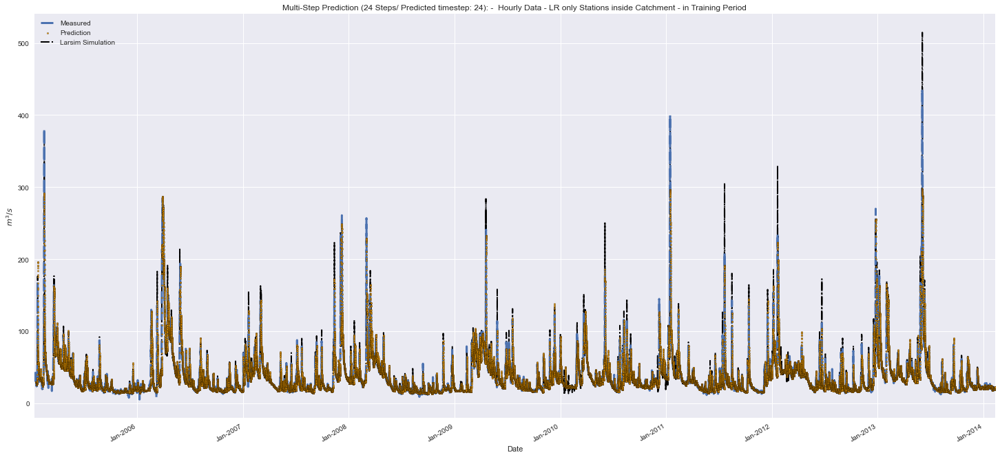

In [ ]:
# Compare Runoff for Training Period
step = 23
fig = gUF.compare_discharge_plot_multistep(train_dataset['q'], train_y_predict_inversed, Larsim_train, f'Multi-Step Prediction ({target_step} Steps/ Predicted timestep: {step + 1}): -  {info_data} - in Training Period', WINDOW_SIZE, step, target_step)

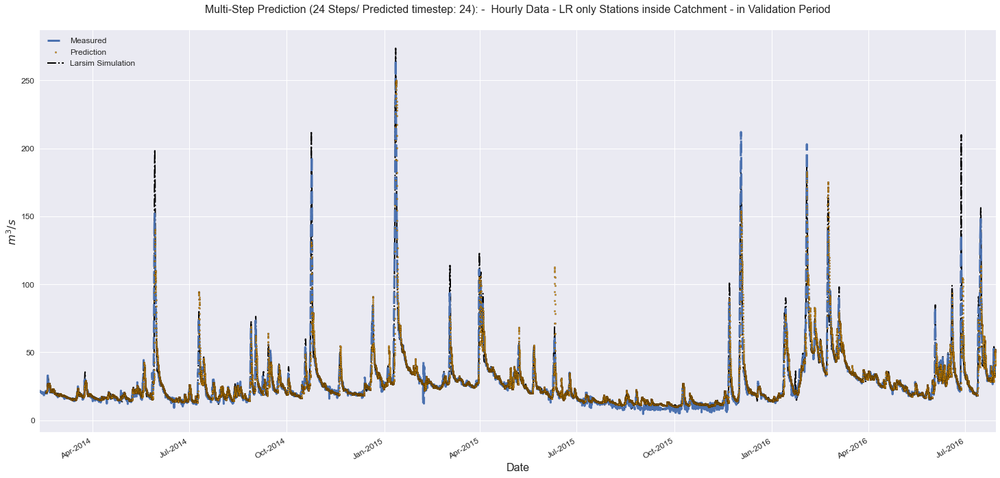

In [ ]:
# Compare Runoff for Validation Period
fig = gUF.compare_discharge_plot_multistep(val_dataset['q'], val_y_predict_inversed, Larsim_val, f'Multi-Step Prediction ({target_step} Steps/ Predicted timestep: {step + 1}): -  {info_data} - in Validation Period', WINDOW_SIZE, step, target_step)

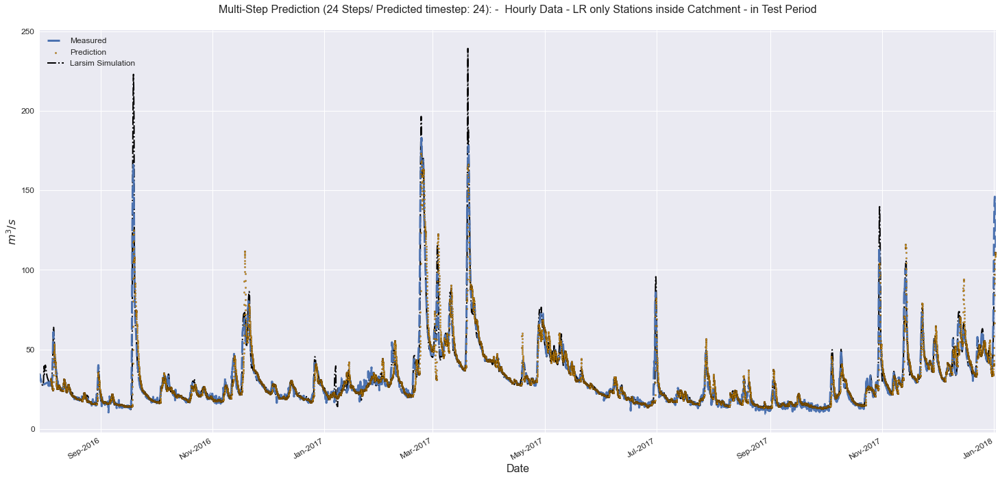

In [ ]:
# Compare Runoff for Training Period
fig = gUF.compare_discharge_plot_multistep(test_dataset['q'], test_y_predict_inversed, Larsim_test, f'Multi-Step Prediction ({target_step} Steps/ Predicted timestep: {step + 1}): -  {info_data} - in Test Period', WINDOW_SIZE, step, target_step)

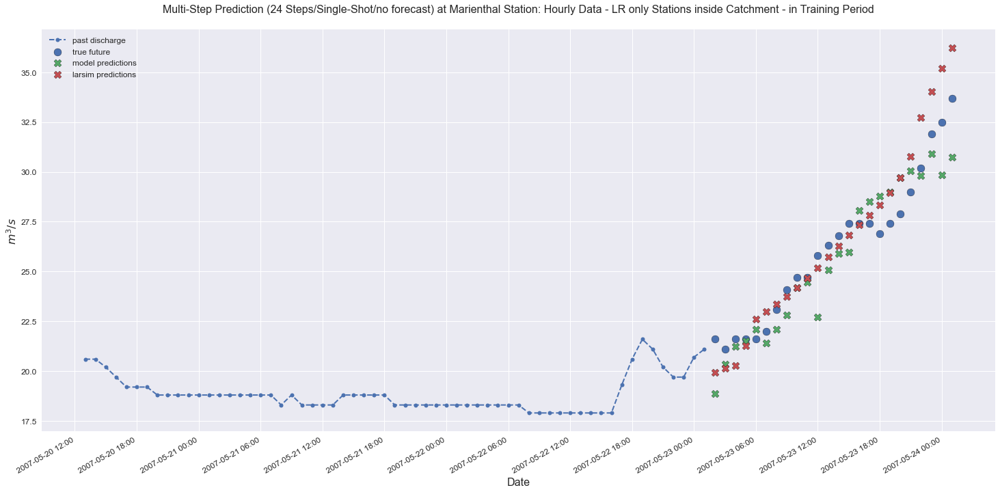

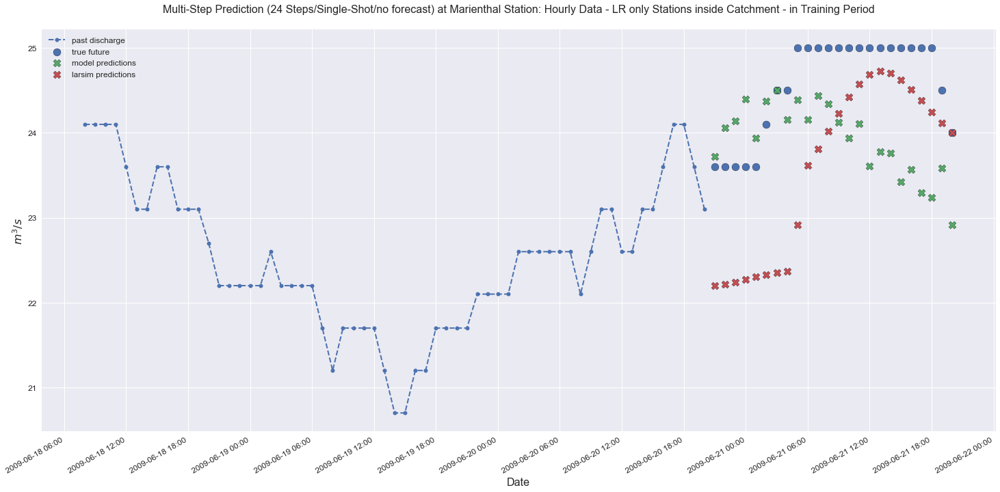

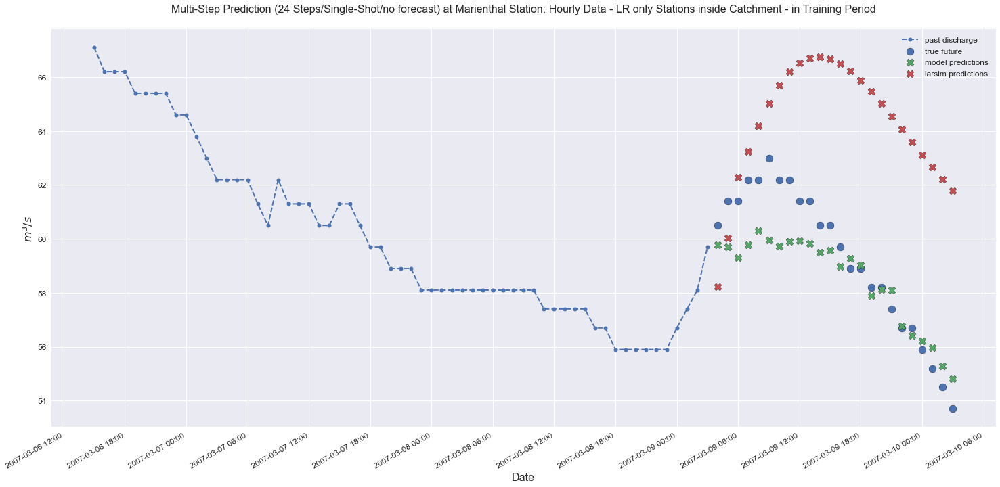

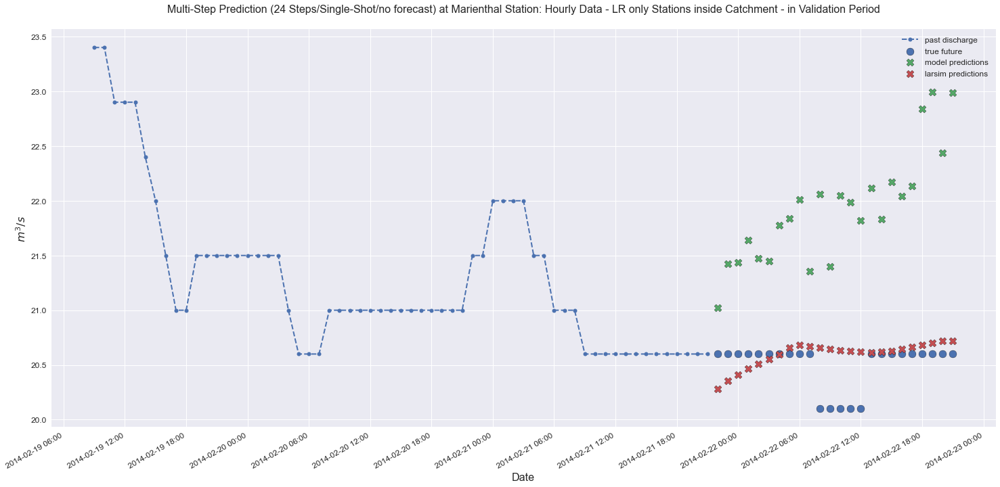

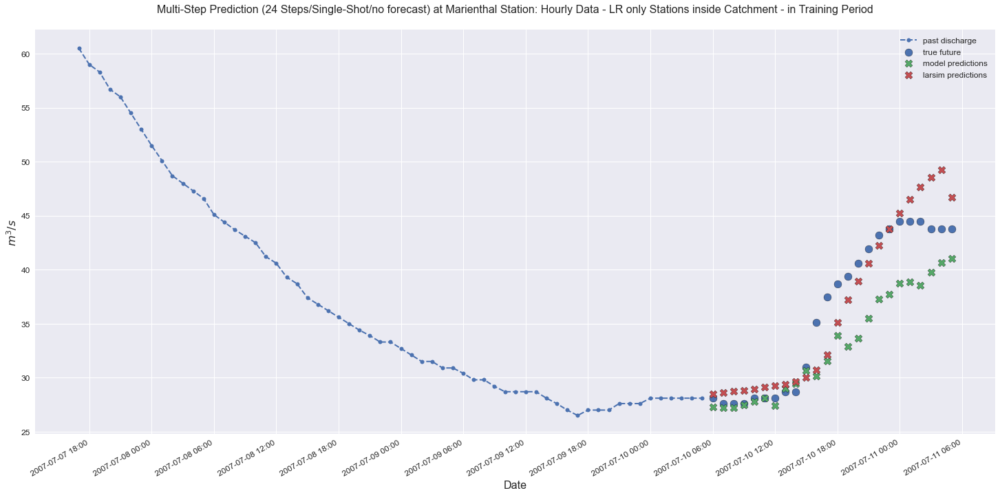

In [ ]:
# Plotting Windows with predictions seperately

# Choosing parameters
lookback = 60   # number of steps of past measurements, that should be shown in the plot
n = 5      # number of plots

#random.seed(3)
total_period = ['2005-01-11 00:00:00', '2018-01-01 23:00:00']
training_period = ['2005-01-16 00:00:00', '2014-02-09 19:00:00']
validation_period = ['2014-02-15 07:00:00',	'2016-07-29 04:00:00']
test_period = ['2016-08-03 16:00:00', '2018-01-01 12:00:00']
date_range = pd.date_range(start= total_period[0], end= total_period[1], freq='H')
rand_index = random.choices(date_range, k= n)
for i in range(0, len(rand_index)):
    rand_index[i] = rand_index[i].strftime(format="%Y-%m-%d %H:%M:%S")

# Plotting Multi-Step Predictions
for i in rand_index:
    if i in df_with_predictions_train.index.strftime(date_format="%Y-%m-%d %H:%M:%S"):
        f = gUF.plot_window_with_predictions(df_with_predictions_train, i , lookback, target_step, f'Multi-Step Prediction ({target_step} Steps/Single-Shot/no forecast) at Marienthal Station: {info_data} - in Training Period')

    if i in df_with_predictions_val.index.strftime(date_format="%Y-%m-%d %H:%M:%S"):
        f = gUF.plot_window_with_predictions(df_with_predictions_val, i , lookback, target_step, f'Multi-Step Prediction ({target_step} Steps/Single-Shot/no forecast) at Marienthal Station: {info_data} - in Validation Period')
    
    if i in df_with_predictions_test.index.strftime(date_format="%Y-%m-%d %H:%M:%S"):
        f = gUF.plot_window_with_predictions(df_with_predictions_test, i , lookback, target_step, f'Multi-Step Prediction ({target_step} Steps/Single-Shot/no forecast) at Marienthal Station: {info_data} - in Test Period')

## Multi-Step prediction with "forecasted values" of meteorological Data
This method is a test for incorporating forecasted values and repleacing true discharge measurements at Marienthal station with predicted ones during the prediction process of the Model. 
Here a single-step model is used.


In [ ]:
#if option_data < 7:  # Daily Data
    # General Settings
    # shuffle_buffer = 10000
    # WINDOW_SIZE = 60  
    # BATCH_SIZE = 20         # higher batch size provides more stability for GPU-Training
    # target_step = 1  
    # # Model Settings
    # num_LSTM_units = 256  
    # EPOCHS = 25  
    # loss_function = 'MAE'    #(options: 'MAE','MSE','NSE')
    # lstm_layers = 2  # will change the used model (options: 1,2,3)

if option_data >= 7:  # Hourly Data
    # General Settings
    shuffle_buffer = 100000
    WINDOW_SIZE = 120  # --> 5 days lookback
    BATCH_SIZE = 200  
    target_step = 1  
    # Model Settings
    num_LSTM_units = 256 
    EPOCHS = 25  
    loss_function = 'MAE'    #(options: 'MAE','MSE','NSE')
    lstm_layers = 2 # will change the used model (options: 1,2,3)

In [ ]:
# Missing Values - Method 2 
if with_target == True:
    # Splitting the Dataset by Size
    training_size = int(len(df) * 0.70)
    validation_size = int(len(df) * 0.19)
    train_dataset, val_dataset, test_dataset = gUF.train_val_test_split(df, (training_size, validation_size), None, validation=True)

    # Scale the data
    scaler = preprocessing.StandardScaler(with_mean=True, with_std=True)
    train_dataset_scaled = scaler.fit_transform(train_dataset) 
    val_dataset_scaled = scaler.transform(val_dataset)
    test_dataset_scaled = scaler.transform(test_dataset)

    # Fill values after Scaling
    fill_value = -7.0
    np.nan_to_num(train_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(val_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(test_dataset_scaled, copy= False, nan= fill_value)

    # Split Training/Validation/Test Dataset into input features and target values/labels 
    train_x, train_y = gUF.windowed_data(train_dataset_scaled, train_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    val_x, val_y = gUF.windowed_data(val_dataset_scaled, val_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    test_x, test_y = gUF.windowed_data(test_dataset_scaled, test_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)

    # Combine resulting features and lables into one Tensor consisting of shuffled batches
    training_data = gUF.batched_dataset(train_x, train_y, BATCH_SIZE, shuffle_buffer, 'training', repeat=True)
    validation_data = gUF.batched_dataset(val_x, val_y, BATCH_SIZE, shuffle_buffer, 'validation', repeat=True)
    testing_data = gUF.batched_dataset(test_x, test_y, BATCH_SIZE, shuffle_buffer, 'testing', repeat=True)
else: 
    # Missing Values - Method 2 and 3 (TARGET EXCLUDED)
    # Splitting the Dataset by Size
    training_size = int(len(df) * 0.70)
    validation_size = int(len(df) * 0.19)
    train_dataset, val_dataset, test_dataset = gUF.train_val_test_split(df, (training_size, validation_size), None, validation=True)

    # Scale the data
    scaler = preprocessing.StandardScaler(with_mean=True, with_std=True)
    train_dataset_scaled = scaler.fit_transform(train_dataset) 
    val_dataset_scaled = scaler.transform(val_dataset)
    test_dataset_scaled = scaler.transform(test_dataset)

    # Fill values after Scaling
    fill_value = -7.0
    np.nan_to_num(train_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(val_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(test_dataset_scaled, copy= False, nan= fill_value)

    # Split Training/Validation/Test Dataset into input features and target values/labels
    train_x, train_y = gUF.windowed_data(train_dataset_scaled[:,:-1], train_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    val_x, val_y = gUF.windowed_data(val_dataset_scaled[:,:-1], val_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    test_x, test_y = gUF.windowed_data(test_dataset_scaled[:,:-1], test_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)

    # Combine resulting features and lables into one Tensor consisting of shuffled batches
    training_data = gUF.batched_dataset(train_x, train_y, BATCH_SIZE, shuffle_buffer, 'training', repeat=True)
    validation_data = gUF.batched_dataset(val_x, val_y, BATCH_SIZE, shuffle_buffer, 'validation', repeat=True)
    testing_data = gUF.batched_dataset(test_x, test_y, BATCH_SIZE, shuffle_buffer, 'testing', repeat=True)

In [ ]:
# Prepare the larsim simulation data
# Larsim_train, Larsim_val, Larsim_test = gUF.train_val_test_split(Larsim_simulations['MARI'], (training_size, validation_size), None,  validation=True)

In [ ]:
# check Dimensions

# train_dataset --> complete Training Dataset after splitting 
print(len(train_dataset))

# val_dataset --> dataset used for validation during fitting of the model
print(len(val_dataset)) # resulting period (i.e. how often do the window fit completetly into the training data): length of the training data - window-size - 1

# test_dataset --> complete Testing Dataset after splitting
print(len(test_dataset))

# check lengths
print('Sum:',len(test_dataset) + len(val_dataset) + len(train_dataset)) # must be equal to the time period of the complete input dataframe
print('_____________________________________')
print(train_x.shape) #(resulting period, window_size, # of input features)
print(val_x.shape) #(resulting period, window_size, # of input features)
print(test_x.shape) #(resulting period, window_size, # of input features)
print('_____________________________________')
# Get coorect input shape for the first layer of the NN
# for LSTM (window_size, # features)
SHAPE = train_x.shape[-2:] 
print('Input_Shape for LSTM:',SHAPE)

79615
21609
12512
Sum: 113736
_____________________________________
(79495, 120, 29)
(21489, 120, 29)
(12392, 120, 29)
_____________________________________
Input_Shape for LSTM: (120, 29)


In [ ]:
# Determine file names and model directory for saveing a model

# file names
if with_discharge == False and with_target == True: 
    target_directory = f"Dataset_{option_data}_Scale_1_Method_2_Validation_1"
if with_discharge == False and with_target == False:
    target_directory = f"Dataset_{option_data}_no_T_Scale_1_Method_2_Validation_1"
if with_discharge == True and with_target == True:
    target_directory = f"Dataset_{option_data}_Q_Scale_1_Method_2_Validation_1"
if with_discharge == True and with_target == False:
    target_directory = f"Dataset_{option_data}_Q_no_T_Scale_1_Method_2_Validation_1"

# directories to safe the model
# the following sub_directory has to be user defined based on the scenario
sub_directory = f"model_config-Loss_{loss_function}_Window_{WINDOW_SIZE}_L-Units_{num_LSTM_units}_L-Layers_{lstm_layers}/"


model_directory = "C:/Users/leonf/Documents/Python/Masterthesis-Leon/Models/Saved_models/" + sub_directory + target_directory

In [ ]:
model_directory

'C:/Users/leonf/Documents/Python/Masterthesis-Leon/Models/Saved_models/model_config-Loss_MAE_Window_120_L-Units_256_L-Layers_2/Dataset_12_Scale_1_Method_2_Validation_1'

In [ ]:
# load a model: --> if used: Skip the next cells until Model Evaluation
model = tf.keras.models.load_model(model_directory)

In [ ]:
# Get the model Summary
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
LSTM_1 (LSTM)                (None, 120, 256)          292864    
_________________________________________________________________
Dropout_1 (Dropout)          (None, 120, 256)          0         
_________________________________________________________________
LSTM_2 (LSTM)                (None, 256)               525312    
_________________________________________________________________
dense (Dense)                (None, 1)                 257       
Total params: 818,433
Trainable params: 818,433
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
# # make predictions (normal way --> single step predictions)
# train_y_predict = model.predict(train_x, batch_size=BATCH_SIZE, verbose=1)
# val_y_predict = model.predict(val_x, batch_size=BATCH_SIZE, verbose=1)
# test_y_predict = model.predict(test_x, batch_size=BATCH_SIZE, verbose=1)

# # Inverse the predictions
# # standard scaler
# train_y_predict_inversed = train_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]
# val_y_predict_inversed = val_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]
# test_y_predict_inversed = test_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]

#### Costumized Prediction Loop

(the execution time is quite long --> predictions only computed for the test data)

In [ ]:
print(test_x.shape)

(12392, 120, 29)


In [ ]:
%%timeit -n10 -r10
# Costumized prediction [Original] --> This loop predicts the number of prediction steps ahead after every hour
 # --> Model predicts one day ahead for every update_step[hour]

# INNER LOOP: 
# - Make single prediction steps into the future for as many steps as defined (by choosing predictions_steps variable)
# - For each step the last observed discharge value (target station) of the next window (used in the next prediction) is replaced by the predicted runoff value 
# - For the same timestep the observed meteorologial data is assumed to be forecasted --> model gets information about "forecasted" meteorological data during each single precition step
# OUTER LOOP: 
# - copy the next windows of true observations
# - Store predicted values in array 

update_step = 1    # how much windows of data are left out (shifted) before the next prediction loop (inner loop) starts again
prediction_steps = 24
test_y_predict_multi = []   # store the results of the full window of prediction steps (outer loop)

for i in range(0, 10):#test_x.shape[0] - prediction_steps + 1, update_step):  # 
    window_prediction_steps = []   # store each single prediction step (inner loop)
    test_x_C = test_x[i : i + prediction_steps + 1][:,:].copy()
    for s in range(prediction_steps):
        window_s = np.expand_dims(test_x_C[s], axis=0)
        #print(window_s[0][-1,-1])    
        y_s = model.predict(window_s, batch_size=1)
        #print(y_s)
        y_s = np.asscalar(y_s)
        window_prediction_steps.append(y_s)
        #Replace last (measured) discharge value within the next window with predicted discharge
        if s < prediction_steps - 1:
            test_x_C[s + 1][-1,-1] = y_s
        #print(test_x_C[s + 1][-1,-1])

    # convert the single prediction steps for one window 
    window_prediction_steps = np.array(window_prediction_steps)
    test_y_predict_multi.append(window_prediction_steps)
    

# convert list to array
test_y_predict_multi = np.array(test_y_predict_multi)

7.53 s ± 148 ms per loop (mean ± std. dev. of 10 runs, 10 loops each)


In [ ]:
%%timeit -n10 -r10
# Costumized prediction [Original] --> This loop predicts the number of prediction steps ahead after every hour
 # --> Model predicts one day ahead for every update_step[hour]

# INNER LOOP: 
# - Make single prediction steps into the future for as many steps as defined (by choosing predictions_steps variable)
# - For each step the last observed discharge value (target station) of the next window (used in the next prediction) is replaced by the predicted runoff value 
# - For the same timestep the observed meteorologial data is assumed to be forecasted --> model gets information about "forecasted" meteorological data during each single precition step
# OUTER LOOP: 
# - copy the next windows of true observations
# - Store predicted values in array 

update_step = 1    # how much windows of data are left out (shifted) before the next prediction loop (inner loop) starts again
prediction_steps = 24
test_y_predict_multi = np.array([])   # store the results of the full window of prediction steps (outer loop)

for i in range(0, 10):#test_x.shape[0] - prediction_steps + 1, update_step):  # 
    window_prediction_steps = np.array([])   # store each single prediction step (inner loop)
    test_x_C = test_x[i : i + prediction_steps + 1][:,:].copy()
    for s in range(prediction_steps):
        window_s = np.expand_dims(test_x_C[s], axis=0)
        #print(window_s[0][-1,-1])    
        y_s = model.predict(window_s, batch_size=1)
        #print(y_s)
        y_s = np.asscalar(y_s)
        window_prediction_steps = np.append(window_prediction_steps, y_s)
        #Replace last (measured) discharge value within the next window with predicted discharge
        if s < prediction_steps - 1:
            test_x_C[s + 1][-1,-1] = y_s
        #print(test_x_C[s + 1][-1,-1])

    # convert the single prediction steps for one window 
    test_y_predict_multi = np.append(test_y_predict_multi, window_prediction_steps)

# convert list to array
test_y_predict_multi = test_y_predict_multi.reshape((-1, prediction_steps))

6.57 s ± 422 ms per loop (mean ± std. dev. of 10 runs, 10 loops each)


In [ ]:
test_y_predict_multi.shape

(10, 24)

In [ ]:
# inverse the predictions
test_y_predict_multi_inversed = test_y_predict_multi * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]

#### Evaluate the model using Performance metrices

In [ ]:
# Create flattend array target data, where for each window the future number of steps (prediction steps) of observed discharge values are stored 
# --> size of new created target array matches the size of the array of predicted values (24 hours ahead)
# --> since Larsim model is updated every 24 hours the step size for the iteration procedure must be 24 hours --> update_step
# --> needs to be done (seperately for training/validation/test set), to calculate the external performance criteria 

# Test Period
targets_test = test_dataset['q'].iloc[WINDOW_SIZE:].values
future_observations_test = []
for i in range(0, len(targets_test) - prediction_steps + 1):#, prediction_steps):
    window_observation = targets_test[i : i + prediction_steps].flatten()
    future_observations_test.append(window_observation.tolist())

future_observations_test = functools.reduce(operator.iconcat, future_observations_test, [])
future_observations_test = np.array(future_observations_test)
future_observations_test_reshaped = future_observations_test.reshape((-1, test_y_predict_multi.shape[1]))  

In [ ]:
future_observations_test_reshaped.shape

(12369, 24)

In [ ]:
# COMPUTE THE PERFORMANCE METRICES FOR EACH FUTURE TARGET STEP INDIVIDUALLY (--> RETURNS A METRICS ARRAY WITH SIZE OF THE TARGET STEPS FOR EACH CRITERIA)
# External Performance Criteria on inverse transformed Data
print(f"\n-------Test----------")
# Test
Performance_test_inversed = gUF.performance_metrics(future_observations_test_reshaped, test_y_predict_multi_inversed, "All", precision=5, mulitoutput=True)
for key, value in Performance_test_inversed.items():
    print(f"{key}: {value}")


-------Test----------
MAX_ERROR: [36.29648 38.26666 38.34859 38.35065 38.35069 38.3507  38.3507  38.3507
 38.3507  38.3507  38.3507  38.3507  38.3507  38.3507  38.3507  38.3507
 38.3507  38.3507  38.3507  38.3507  38.3507  38.3507  38.3507  38.3507 ]
MAE: [1.16263 1.21251 1.21561 1.21602 1.21623 1.2163  1.21623 1.21615 1.21602
 1.21597 1.21589 1.21587 1.21587 1.21592 1.21602 1.21618 1.21648 1.21684
 1.21729 1.21787 1.21844 1.21894 1.21953 1.22031]
MSE: [4.70095 5.2764  5.31883 5.32247 5.32331 5.32344 5.32334 5.32322 5.32296
 5.32281 5.32268 5.32266 5.32266 5.32272 5.32288 5.32332 5.32461 5.32696
 5.33035 5.33558 5.33979 5.34374 5.34873 5.35661]
RMSE: [2.16817 2.29704 2.30626 2.30705 2.30723 2.30726 2.30724 2.30721 2.30715
 2.30712 2.30709 2.30709 2.30709 2.3071  2.30714 2.30723 2.30751 2.30802
 2.30876 2.30989 2.3108  2.31165 2.31273 2.31444]
MeAE: [0.68151 0.7004  0.70132 0.70138 0.70143 0.70145 0.70143 0.70138 0.70133
 0.70133 0.7008  0.7008  0.7008  0.70133 0.70138 0.70143 0.70145 

In [ ]:
# COMPUTE THE AVERAGE PERFORMANCE METRICES (across prediction steps)

Performance_test_inversed_avg = {}
print(f"\n-------Test----------")
for key, value in Performance_test_inversed.items():
    Performance_test_inversed_avg[key] = np.round(Performance_test_inversed[key].mean(), 5)
for key, value in Performance_test_inversed_avg.items():
    print(f"{key}: {value}")


-------Test----------
MAX_ERROR: 38.26152
MAE: 1.21438
MSE: 5.30004
RMSE: 2.30201
MeAE: 0.70061
REV: -0.02705
NSE: 0.98706
KGNP: 0.98977


## Multi-Step (Single-Shot) prediction with "forecasted values" meteorological Data 
! This method is not reasonable, since in the input window the target values of the same time steps are included and fed into the network
 --> Model is able to perform one-to-one mapping (see very high performance)

In [ ]:
# if option_data < 7:  # Daily Data
#     # General Settings
#     shuffle_buffer = 10000
#     WINDOW_SIZE = 60  
#     BATCH_SIZE = 20         # higher batch size provides more stability for GPU-Training
#     target_step = 1  
#     # Model Settings
#     num_LSTM_units = 256  
#     EPOCHS = 25  
#     loss_function = 'MAE'    #(options: 'MAE','MSE','NSE')
#     lstm_layers = 2  # will change the used model (options: 1,2,3)

if option_data >= 7:  # Hourly Data
    # General Settings
    shuffle_buffer = 100000
    WINDOW_SIZE = 120  # --> 5 days lookback
    BATCH_SIZE = 200  
    target_step = 12  
    # Model Settings
    num_LSTM_units = 120  
    EPOCHS = 25  
    loss_function = 'MAE'    #(options: 'MAE','MSE','NSE')
    lstm_layers = 2 # will change the used model (options: 1,2,3)

In [ ]:
# Missing Values - Method 2 
if with_target == True:
    # Splitting the Dataset by Size
    training_size = int(len(df) * 0.70)
    validation_size = int(len(df) * 0.19)
    train_dataset, val_dataset, test_dataset = gUF.train_val_test_split(df, (training_size, validation_size), None, validation=True)

    # Scale the data
    scaler = preprocessing.StandardScaler(with_mean=True, with_std=True)
    train_dataset_scaled = scaler.fit_transform(train_dataset) 
    val_dataset_scaled = scaler.transform(val_dataset)
    test_dataset_scaled = scaler.transform(test_dataset)

    # Fill values after Scaling
    fill_value = -7.0
    np.nan_to_num(train_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(val_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(test_dataset_scaled, copy= False, nan= fill_value)

    # Split Training/Validation/Test Dataset into input features and target values/labels
    train_x, train_y = gUF.windowed_data_with_forecast(train_dataset_scaled, train_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    val_x, val_y = gUF.windowed_data_with_forecast(val_dataset_scaled, val_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    test_x, test_y = gUF.windowed_data_with_forecast(test_dataset_scaled, test_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)

    # Combine resulting features and lables into one Tensor consisting of shuffled batches
    training_data = gUF.batched_dataset(train_x, train_y, BATCH_SIZE, shuffle_buffer, 'training', repeat=True)
    validation_data = gUF.batched_dataset(val_x, val_y, BATCH_SIZE, shuffle_buffer, 'validation', repeat=True)
    testing_data = gUF.batched_dataset(test_x, test_y, BATCH_SIZE, shuffle_buffer, 'testing', repeat=True)
else: 
    # Missing Values - Method 2 and 3 (TARGET EXCLUDED)
    # Splitting the Dataset by Size
    training_size = int(len(df) * 0.70)
    validation_size = int(len(df) * 0.19)
    train_dataset, val_dataset, test_dataset = gUF.train_val_test_split(df, (training_size, validation_size), None, validation=True)

    # Scale the data
    scaler = preprocessing.StandardScaler(with_mean=True, with_std=True)
    train_dataset_scaled = scaler.fit_transform(train_dataset) 
    val_dataset_scaled = scaler.transform(val_dataset)
    test_dataset_scaled = scaler.transform(test_dataset)

    # Fill values after Scaling
    fill_value = -7.0
    np.nan_to_num(train_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(val_dataset_scaled, copy= False, nan= fill_value)
    np.nan_to_num(test_dataset_scaled, copy= False, nan= fill_value)

    # Split Training/Validation/Test Dataset into input features and target values/labels
    train_x, train_y = gUF.windowed_data_with_forecast(train_dataset_scaled[:,:-1], train_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    val_x, val_y = gUF.windowed_data_with_forecast(val_dataset_scaled[:,:-1], val_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)
    test_x, test_y = gUF.windowed_data_with_forecast(test_dataset_scaled[:,:-1], test_dataset_scaled[:,-1], WINDOW_SIZE, target_step, single_step=False)

    # Combine resulting features and lables into one Tensor consisting of shuffled batches
    training_data = gUF.batched_dataset(train_x, train_y, BATCH_SIZE, shuffle_buffer, 'training', repeat=True)
    validation_data = gUF.batched_dataset(val_x, val_y, BATCH_SIZE, shuffle_buffer, 'validation', repeat=True)
    testing_data = gUF.batched_dataset(test_x, test_y, BATCH_SIZE, shuffle_buffer, 'testing', repeat=True)

In [ ]:
# Prepare the larsim simulation data
Larsim_train, Larsim_val, Larsim_test = gUF.train_val_test_split(Larsim_simulations['MARI'], (training_size, validation_size), None,  validation=True)

In [ ]:
# OPTIONAL
# checking the number of necessary(minimum) evaluation steps and validation steps --> This Cell is only needed when the input Dataset is a Repeated Dataset 
# Ensure that the whole the different datasets are used completely: steps_per_epoch = (len(dataset) - WINDOW_SIZE)//(BATCH_SIZE)
steps_in_one_epoch = (len(train_dataset) - WINDOW_SIZE)//(BATCH_SIZE)
print(steps_in_one_epoch)
validation_steps_after_one_epoch = (len(val_dataset) - WINDOW_SIZE)//(BATCH_SIZE)
print(validation_steps_after_one_epoch)
testing_steps = (len(test_dataset) - WINDOW_SIZE)//(BATCH_SIZE)
print(testing_steps)

# Set the evaluation interval manually --> steps (batches of samples = batch_size * steps)
# default values --> each batch of samples of the datasets are exaclty shown once to the model 
TRAINING_INTERVAL = steps_in_one_epoch
VALUATION_INTERVAL = validation_steps_after_one_epoch
TEST_INTERVAL = testing_steps

397
107
61


In [ ]:
# check Dimensions

# train_dataset --> complete Training Dataset after splitting 
print(len(train_dataset))

# val_dataset --> dataset used for validation during fitting of the model
print(len(val_dataset)) # resulting period (i.e. how often do the window fit completetly into the training data): length of the training data - window-size - 1

# test_dataset --> complete Testing Dataset after splitting
print(len(test_dataset))

# check lengths
print('Sum:',len(test_dataset) + len(val_dataset) + len(train_dataset)) # must be equal to the time period of the complete input dataframe
print('_____________________________________')
print(train_x.shape) #(resulting period, window_size, # of input features)
print(val_x.shape) #(resulting period, window_size, # of input features)
print(test_x.shape) #(resulting period, window_size, # of input features)
print('_____________________________________')
# Get coorect input shape for the first layer of the NN
# for LSTM (window_size, # features)
SHAPE = train_x.shape[-2:] 
print('Input_Shape for LSTM:',SHAPE)

79615
21609
12512
Sum: 113736
_____________________________________
(79496, 120, 29)
(21490, 120, 29)
(12393, 120, 29)
_____________________________________
Input_Shape for LSTM: (120, 29)


In [ ]:
# Determine file names and model directory for saveing a model

# file names
if with_discharge == False and with_target == True: 
    target_directory = f"Dataset_{option_data}_Scale_1_Method_2_Validation_1"
if with_discharge == False and with_target == False:
    target_directory = f"Dataset_{option_data}_no_T_Scale_1_Method_2_Validation_1"
if with_discharge == True and with_target == True:
    target_directory = f"Dataset_{option_data}_Q_Scale_1_Method_2_Validation_1"
if with_discharge == True and with_target == False:
    target_directory = f"Dataset_{option_data}_Q_no_T_Scale_1_Method_2_Validation_1"

# directories to safe the model
# the following sub_directory has to be user defined based on the scenario
sub_directory_1 = f"Single-Shot_model_with_forcast_Steps-{target_step}/"

sub_directory_2 = f"model_config-Loss_{loss_function}_Window_{WINDOW_SIZE}_L-Units_{num_LSTM_units}_L-Layers_{lstm_layers}/"


model_directory = "C:/Users/leonf/Documents/Python/Masterthesis-Leon/Models/Saved_models/Multi_Step/" + sub_directory_1 + sub_directory_2 + target_directory

In [ ]:
# load a model: --> if used: Skip the next cells until Model Evaluation
#model = tf.keras.models.load_model(model_directory)

In [ ]:
# Create and compile Model
def get_multistep_model(num_LSTM_units, SHAPE, loss, target_step):
    # Create and Compile the LSTM Model
    model = tf.keras.models.Sequential()
    model.add(
        tf.keras.layers.LSTM(
            units=num_LSTM_units,
            activation="tanh",
            return_sequences=True,
            use_bias=True,
            kernel_initializer= tf.keras.initializers.RandomUniform(seed=7),
            bias_initializer= tf.keras.initializers.RandomUniform(seed=7),
            input_shape=SHAPE,
            name="LSTM_1",
        )
    )
    model.add(tf.keras.layers.Dropout(0.45, name="Dropout_1"))
    model.add(tf.keras.layers.LSTM(units=num_LSTM_units, name="LSTM_2"))
    model.add(tf.keras.layers.Dense(target_step))

    # adapt metrics with respect to loss function
    if loss == 'NSE':
        loss = NSE_loss
        observed_metrics = ["mae", "mse", tf.keras.metrics.RootMeanSquaredError()]
    if loss == 'MAE':
        observed_metrics = ["mse", tf.keras.metrics.RootMeanSquaredError()]
    if loss == 'MSE':
        observed_metrics = ["mae", tf.keras.metrics.RootMeanSquaredError()]

    # Compile the Model
    # optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1)
    model.compile(
        loss=loss,
        optimizer="adagrad",
        metrics= observed_metrics,
    )

    return model

In [ ]:
# Clear Cache and use random seed for reproducability
tf.keras.backend.clear_session()
tf.random.set_seed(7)

model = get_multistep_model(num_LSTM_units, SHAPE, loss_function, target_step)

In [ ]:
# Get the model Summary
print(model.summary())

Model: &quot;sequential&quot;
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
LSTM_1 (LSTM)                (None, 120, 120)          72000     
_________________________________________________________________
Dropout_1 (Dropout)          (None, 120, 120)          0         
_________________________________________________________________
LSTM_2 (LSTM)                (None, 120)               115680    
_________________________________________________________________
dense (Dense)                (None, 12)                1452      
Total params: 189,132
Trainable params: 189,132
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
# Implement Learning Rate Scheduler --> look for range of a good learning rate
callbacks = tf.keras.callbacks.LearningRateScheduler(gUF.lr_schedule)
# Fit the Model
history = model.fit(training_data, epochs= EPOCHS, verbose=1, steps_per_epoch=TRAINING_INTERVAL, validation_data= validation_data, validation_steps=VALUATION_INTERVAL, callbacks=[callbacks])

Epoch 1/25
397/397 [==============================] - 16s 41ms/step - loss: 0.1297 - mse: 0.2039 - root_mean_squared_error: 0.4516 - val_loss: 0.0631 - val_mse: 0.0244 - val_root_mean_squared_error: 0.1561 - lr: 0.0010
Epoch 2/25
397/397 [==============================] - 15s 38ms/step - loss: 0.0772 - mse: 0.0923 - root_mean_squared_error: 0.3037 - val_loss: 0.0525 - val_mse: 0.0151 - val_root_mean_squared_error: 0.1228 - lr: 0.0010
Epoch 3/25
397/397 [==============================] - 15s 38ms/step - loss: 0.0669 - mse: 0.0714 - root_mean_squared_error: 0.2672 - val_loss: 0.0467 - val_mse: 0.0112 - val_root_mean_squared_error: 0.1059 - lr: 0.0010
Epoch 4/25
397/397 [==============================] - 15s 38ms/step - loss: 0.0612 - mse: 0.0606 - root_mean_squared_error: 0.2462 - val_loss: 0.0455 - val_mse: 0.0098 - val_root_mean_squared_error: 0.0991 - lr: 0.0010
Epoch 5/25
397/397 [==============================] - 15s 38ms/step - loss: 0.0572 - mse: 0.0532 - root_mean_squared_error: 

In [ ]:
# Save the model
model.save(model_directory, overwrite=True, include_optimizer=True, save_format='tf')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: C:/Users/leonf/Documents/Python/Masterthesis-Leon/Models/Saved_models/Multi_Step/Single-Shot_model_with_forcast_Steps-12/model_config-Loss_MAE_Window_120_L-Units_120_L-Layers_2/Dataset_12_Scale_1_Method_2_Validation_1\assets


In [ ]:
# EVALUATION On windowed Datasets (numpy arrays)
# Evaluate the Model -> train_x
print('-------Training----------\n')
results_train = model.evaluate(x= train_x, y= train_y, verbose= 0, batch_size= BATCH_SIZE)
result_dict_train = dict(zip(model.metrics_names, results_train))
for key, value in result_dict_train.items():
  print(key, ":", round(value,5))

print('\n-------Validation----------\n')
# Evaluate the Model -> val_x
results_val = model.evaluate(x= val_x, y= val_y, verbose= 0, batch_size= BATCH_SIZE)
result_dict_val = dict(zip(model.metrics_names, results_val))
for key, value in result_dict_val.items():
  print(key, ":", round(value,5))

print('\n-------Test----------\n')
# Evaluate the Model -> test_x
results_test = model.evaluate(x= test_x, y= test_y, verbose= 0, batch_size= BATCH_SIZE)
result_dict_test = dict(zip(model.metrics_names, results_test))
for key, value in result_dict_test.items():
  print(key, ":", round(value,5))

-------Training----------

loss : 0.02899
mse : 0.02319
root_mean_squared_error : 0.15229

-------Validation----------

loss : 0.03083
mse : 0.00386
root_mean_squared_error : 0.06215

-------Test----------

loss : 0.02521
mse : 0.00196
root_mean_squared_error : 0.04427


In [ ]:
# make predictions
train_y_predict = model.predict(train_x, batch_size=BATCH_SIZE, verbose=1).flatten()
val_y_predict = model.predict(val_x, batch_size=BATCH_SIZE, verbose=1).flatten()
test_y_predict = model.predict(test_x, batch_size=BATCH_SIZE, verbose=1).flatten()

62/62 [==============================] - 1s 10ms/step


In [ ]:
# Inverse the predictions

# standard scaler
train_y_predict_inversed = train_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]
val_y_predict_inversed = val_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]
test_y_predict_inversed = test_y_predict * np.sqrt(scaler.var_[-1]) + scaler.mean_[-1]

In [ ]:
train_y.shape

(79496, 12)

In [ ]:
train_y_predict_inversed.shape

(953952,)

In [ ]:
# Create flattend array of targets, where for each window (within the window) the last number of steps (target steps) of measured discharge values are stored 
# --> size of new created target array matches the size of the array of predicted values
# --> needs to be done (seperately for training/validation/test set), to calculate the external performance criteria 

# Training Period
targets_train = train_dataset['q'].iloc[WINDOW_SIZE - target_step:].values
future_observations_train = []
for i in range(0, len(targets_train) - target_step + 1):
    window_observation = targets_train[i : i + target_step].flatten()
    future_observations_train.append(window_observation.tolist())

future_observations_train = functools.reduce(operator.iconcat, future_observations_train, [])
future_observations_train = np.array(future_observations_train)

# Validation Period
targets_val = val_dataset['q'].iloc[WINDOW_SIZE - target_step:].values
future_observations_val = []
for i in range(0, len(targets_val) - target_step + 1):
    window_observation = targets_val[i : i + target_step].flatten()
    future_observations_val.append(window_observation.tolist())

future_observations_val = functools.reduce(operator.iconcat, future_observations_val, [])
future_observations_val = np.array(future_observations_val)

# # Test Period
targets_test = test_dataset['q'].iloc[WINDOW_SIZE - target_step:].values
future_observations_test = []
for i in range(0, len(targets_test) - target_step + 1):
    window_observation = targets_test[i : i + target_step].flatten()
    future_observations_test.append(window_observation.tolist())

future_observations_test = functools.reduce(operator.iconcat, future_observations_test, [])
future_observations_test = np.array(future_observations_test)

In [ ]:
# External Performance Criteria on inverse transformed Data

#Training
print(f"\n-------Training----------")
Performance_train_inversed = gUF.performance_metrics(future_observations_train, train_y_predict_inversed, "All", precision=5)
for key, value in Performance_train_inversed.items():
    print(f"{key}: {value}")

print(f"\n-------Validation----------")
# Validation
Performance_val_inversed = gUF.performance_metrics(future_observations_val, val_y_predict_inversed, "All", precision=5,)
for key, value in Performance_val_inversed.items():
    print(f"{key}: {value}")

print(f"\n-------Test----------")
# Test
Performance_test_inversed = gUF.performance_metrics(future_observations_test, test_y_predict_inversed, "All", precision=5)
for key, value in Performance_test_inversed.items():
    print(f"{key}: {value}")


-------Training----------
MAX_ERROR: 193.8452
MAE: 0.87231
MSE: 21.0054
RMSE: 4.58316
MeAE: 0.36372
REV: -0.38154
NSE: 0.97684
KGNP: 0.99329

-------Validation----------
MAX_ERROR: 65.14633
MAE: 0.92793
MSE: 3.49832
RMSE: 1.87038
MeAE: 0.46616
REV: 0.78864
NSE: 0.99213
KGNP: 0.98526

-------Test----------
MAX_ERROR: 39.44078
MAE: 0.75861
MSE: 1.77496
RMSE: 1.33228
MeAE: 0.44083
REV: 0.05402
NSE: 0.99572
KGNP: 0.99416


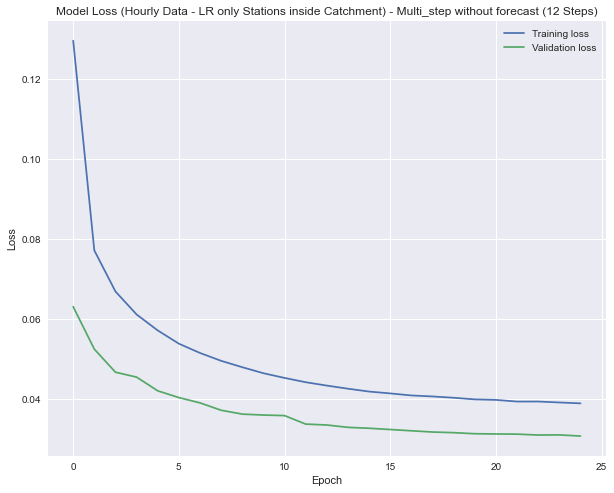

In [ ]:
f = gUF.plot_train_history_normal(history, f"Model Loss ({info_data}) - Multi_step without forecast ({str(target_step)} Steps)")

In [ ]:
# Create Dataframes for plotting
df_with_predictions = model_data['q']
df_with_predictions = df_with_predictions.astype(object)  # this line allows the signment of the array
df_with_predictions.rename(columns={'MARI': 'observations'}, inplace=True) 
df_with_predictions['predictions'] = 0
df_with_predictions_train, df_with_predictions_val, df_with_predictions_test = gUF.train_val_test_split(df_with_predictions, (training_size, validation_size), None, validation=True)

# Training Data
df_with_predictions_train = df_with_predictions_train[:(training_size-target_step + 1)]
df_with_predictions_train['Larsim'] = Larsim_train
df_with_predictions_train = df_with_predictions_train.astype(object)

# Validation Data
df_with_predictions_val = df_with_predictions_val[:(validation_size-target_step + 1)]
df_with_predictions_val['Larsim'] = Larsim_val
df_with_predictions_val = df_with_predictions_val.astype(object)

# Test Data
df_with_predictions_test = df_with_predictions_test[: -target_step + 1]
df_with_predictions_test['Larsim'] = Larsim_test
df_with_predictions_test = df_with_predictions_test.astype(object)

In [ ]:
# Fill Dataframe with predictions for Training Period with arrays of multi-step Predictions
predictions = []
for i in range(0, len(train_y_predict_inversed), target_step):
    window_prediction = np.array(train_y_predict_inversed[i : i + target_step])
    predictions.append(window_prediction)

for i in range(0, len(predictions)):
    df_with_predictions_train['predictions'].iloc[WINDOW_SIZE - target_step + i] = predictions[i]

# Fill Dataframe with predictions for Validation Period with arrays of multi-step Predictions
predictions = []
for i in range(0, len(val_y_predict_inversed), target_step):
    window_prediction = np.array(val_y_predict_inversed[i : i + target_step])
    predictions.append(window_prediction)

for i in range(0, len(predictions)):
    df_with_predictions_val['predictions'].iloc[WINDOW_SIZE - target_step + i] = predictions[i]

# Fill Dataframe with predictions for Test Period with arrays of multi-step Predictions
predictions = []
for i in range(0, len(test_y_predict_inversed), target_step):
    window_prediction = np.array(test_y_predict_inversed[i : i + target_step])
    predictions.append(window_prediction)

for i in range(0, len(predictions)):
    df_with_predictions_test['predictions'].iloc[WINDOW_SIZE - target_step + i] = predictions[i]

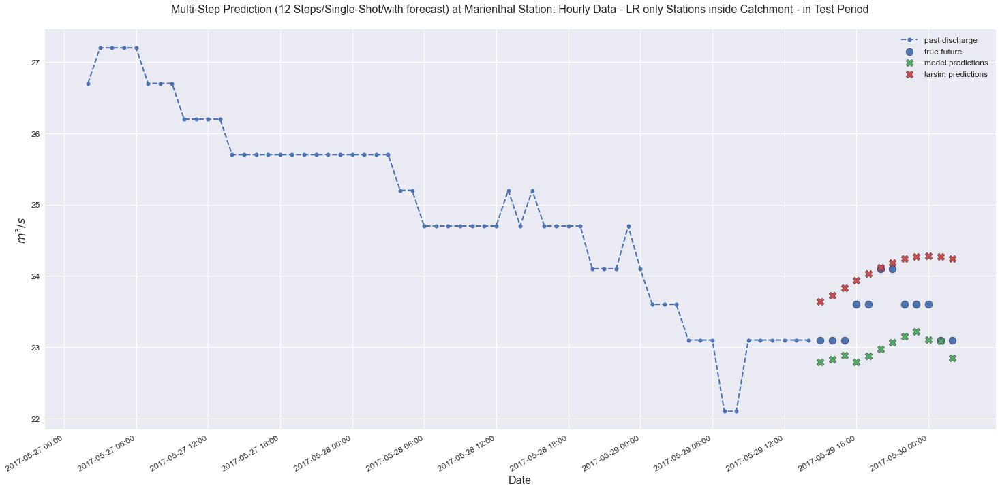

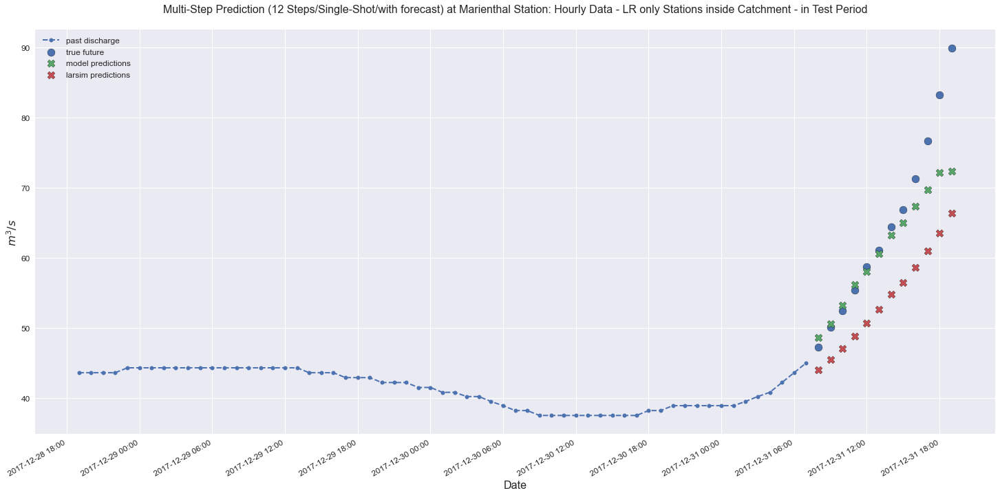

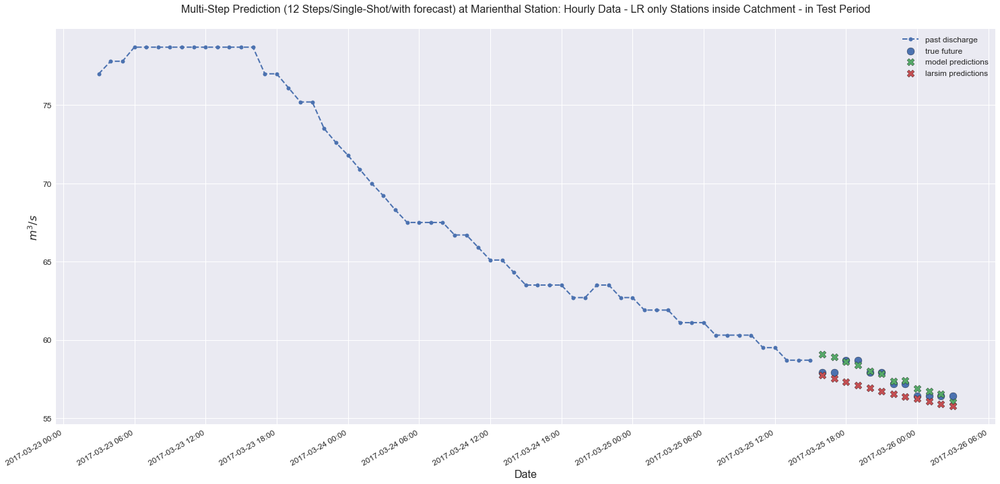

In [ ]:
# Choosing parameters
lookback = 60   # number of steps of past measurements, that should be shown in the plot
n = 3       # number of plots

#random.seed(3)
total_period = ['2005-01-11 00:00:00', '2018-01-01 23:00:00']
training_period = ['2005-01-15 12:00:00', '2014-02-09 19:00:00']
validation_period = ['2014-02-14 20:00:00',	'2016-07-29 04:00:00']
test_period = ['2016-08-03 05:00:00', '2018-01-01 12:00:00']
date_range = pd.date_range(start= test_period[0], end= test_period[1], freq='H')
rand_index = random.choices(date_range, k= n)
for i in range(0, len(rand_index)):
    rand_index[i] = rand_index[i].strftime(format="%Y-%m-%d %H:%M:%S")

# Plotting Multi-Step Predictions
for i in rand_index:
    if i in df_with_predictions_train.index.strftime(date_format="%Y-%m-%d %H:%M:%S"):
        f = gUF.plot_window_with_predictions(df_with_predictions_train, i , lookback, target_step, f'Multi-Step Prediction ({target_step} Steps/Single-Shot/with forecast) at Marienthal Station: {info_data} - in Training Period')

    if i in df_with_predictions_val.index.strftime(date_format="%Y-%m-%d %H:%M:%S"):
        f = gUF.plot_window_with_predictions(df_with_predictions_val, i , lookback, target_step, f'Multi-Step Prediction ({target_step} Steps/Single-Shot/with forecast) at Marienthal Station: {info_data} - in Validation Period')
    
    if i in df_with_predictions_test.index.strftime(date_format="%Y-%m-%d %H:%M:%S"):
        f = gUF.plot_window_with_predictions(df_with_predictions_test, i , lookback, target_step, f'Multi-Step Prediction ({target_step} Steps/Single-Shot/with forecast) at Marienthal Station: {info_data} - in Test Period')